<a href="https://colab.research.google.com/github/manujjoshi/Dog-va-Cat-Classifier/blob/main/Dogs_vs_cats_classifier_3_feb_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### [Question PDF](https://dme2wmiz2suov.cloudfront.net/User(4778996)/Course(24649)/Section(131951)/Exercise(32410)/Assignment/1493914-1447533-DogsvsCats_classification.pdf?Expires=1675426245&Signature=cuyHgpg2c7LKzhwjHxyh0EWkV14-m4rAmfirz7dtthYZIGsaXDs-4L3XmvR7NlL4MPvwPvIykcBNIhsPDiRWcGCa5~2c0Ok0Ozimu1MCVHqIcD6Yqw4xcl0XIgcP0yXBotaGI9ZqZZLGAohzWhBDx3v8FAzNVX-kmXVzN2RiW4CM9b8r4f1bZTmhXNnFbx1h9Um02RrreH8zSYPLvc9OixfCFy-RYX289PShhN8jLJbvImOpS73mgOy4fE3k4RR3qrcLLf57ZZ9HrKNxXK4YPyFXkitlz~xt8V4i9rz5npOlt29o~ninQhB24Zl9ia-4nsqlLVFKeaKCuiuT10au-w__&Key-Pair-Id=APKAIIFZDCEANAVU2VTA)

In [1]:
import os
os.environ['KAGGLE_CONFIG_DIR']='/content'
!kaggle competitions download -c dogs-vs-cats

 96% 259M/271M [00:01<00:00, 200MB/s]
100% 271M/271M [00:01<00:00, 192MB/s]
 99% 540M/543M [00:03<00:00, 195MB/s]
100% 543M/543M [00:03<00:00, 184MB/s]
  0% 0.00/86.8k [00:00<?, ?B/s]
100% 86.8k/86.8k [00:00<00:00, 77.9MB/s]


# **Dogs vs Cats classifier**

In [2]:
!unzip train.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/dog.5499.jpg      
  inflating: train/dog.55.jpg        
  inflating: train/dog.550.jpg       
  inflating: train/dog.5500.jpg      
  inflating: train/dog.5501.jpg      
  inflating: train/dog.5502.jpg      
  inflating: train/dog.5503.jpg      
  inflating: train/dog.5504.jpg      
  inflating: train/dog.5505.jpg      
  inflating: train/dog.5506.jpg      
  inflating: train/dog.5507.jpg      
  inflating: train/dog.5508.jpg      
  inflating: train/dog.5509.jpg      
  inflating: train/dog.551.jpg       
  inflating: train/dog.5510.jpg      
  inflating: train/dog.5511.jpg      
  inflating: train/dog.5512.jpg      
  inflating: train/dog.5513.jpg      
  inflating: train/dog.5514.jpg      
  inflating: train/dog.5515.jpg      
  inflating: train/dog.5516.jpg      
  inflating: train/dog.5517.jpg      
  inflating: train/dog.5518.jpg      
  inflating: train/dog.5519.jpg      
  inflating: train/dog.552.jpg       

In [3]:
!unzip test1.zip

Streaming output truncated to the last 5000 lines.
  inflating: test1/5499.jpg          
  inflating: test1/55.jpg            
  inflating: test1/550.jpg           
  inflating: test1/5500.jpg          
  inflating: test1/5501.jpg          
  inflating: test1/5502.jpg          
  inflating: test1/5503.jpg          
  inflating: test1/5504.jpg          
  inflating: test1/5505.jpg          
  inflating: test1/5506.jpg          
  inflating: test1/5507.jpg          
  inflating: test1/5508.jpg          
  inflating: test1/5509.jpg          
  inflating: test1/551.jpg           
  inflating: test1/5510.jpg          
  inflating: test1/5511.jpg          
  inflating: test1/5512.jpg          
  inflating: test1/5513.jpg          
  inflating: test1/5514.jpg          
  inflating: test1/5515.jpg          
  inflating: test1/5516.jpg          
  inflating: test1/5517.jpg          
  inflating: test1/5518.jpg          
  inflating: test1/5519.jpg          
  inflating: test1/552.jpg           

In [4]:
train_path= '/content/train'
test_path= '/content/test1'

In [50]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
import os
from tensorflow.keras import Sequential
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D,GlobalAveragePooling2D,Dropout,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img

In [6]:
dirls = os.listdir(train_path)
print(dirls)
val = train_path + '/'+dirls[0]
print(val)

['cat.8417.jpg', 'dog.1969.jpg', 'cat.7494.jpg', 'dog.10205.jpg', 'cat.9249.jpg', 'dog.6109.jpg', 'cat.2920.jpg', 'cat.7299.jpg', 'cat.3613.jpg', 'dog.10619.jpg', 'dog.5144.jpg', 'cat.10273.jpg', 'dog.4296.jpg', 'dog.4448.jpg', 'dog.9272.jpg', 'dog.11201.jpg', 'cat.12054.jpg', 'dog.2468.jpg', 'dog.952.jpg', 'cat.9371.jpg', 'dog.11717.jpg', 'cat.10830.jpg', 'cat.6682.jpg', 'dog.494.jpg', 'dog.6905.jpg', 'dog.8194.jpg', 'cat.12241.jpg', 'dog.7943.jpg', 'cat.1826.jpg', 'dog.10747.jpg', 'cat.8061.jpg', 'cat.2579.jpg', 'dog.621.jpg', 'dog.9025.jpg', 'cat.1287.jpg', 'dog.1154.jpg', 'cat.11608.jpg', 'cat.3753.jpg', 'cat.1606.jpg', 'cat.11390.jpg', 'cat.2749.jpg', 'dog.675.jpg', 'dog.4111.jpg', 'cat.8252.jpg', 'cat.4183.jpg', 'dog.11306.jpg', 'dog.7504.jpg', 'dog.1043.jpg', 'dog.951.jpg', 'dog.11406.jpg', 'cat.1467.jpg', 'cat.801.jpg', 'cat.4604.jpg', 'dog.5844.jpg', 'dog.3929.jpg', 'cat.5398.jpg', 'dog.106.jpg', 'cat.4840.jpg', 'cat.5494.jpg', 'cat.566.jpg', 'dog.10571.jpg', 'dog.8346.jpg', '

## **arranging into dataframe**

In [7]:
def list_full_paths(directory):
    return [os.path.join(directory, file) for file in os.listdir(directory)]

train = pd.DataFrame({'filepath': list_full_paths('/content/train')})
train['truth_label'] = np.where(train['filepath'].str.contains('dog'), 'dog', 'cat')

# test = pd.DataFrame({'filepath': list_full_paths('/content/test1')})

In [8]:
train.head()

,filepath,truth_label
0,/content/train/cat.8417.jpg,cat
1,/content/train/dog.1969.jpg,dog
2,/content/train/cat.7494.jpg,cat
3,/content/train/dog.10205.jpg,dog
4,/content/train/cat.9249.jpg,cat


In [9]:
train['truth_label'].value_counts()

cat    12500
dog    12500
Name: truth_label, dtype: int64

## **data is balanced**

<class 'numpy.ndarray'>
(374, 500, 3)


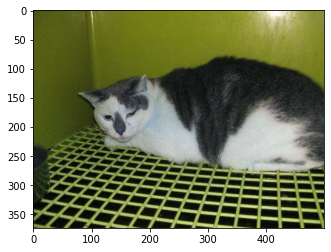

In [10]:
img = cv2.imread(train['filepath'][0])
print(type(img))
print(img.shape)
plt.imshow(img)

<class 'numpy.ndarray'>
(207, 300, 3)


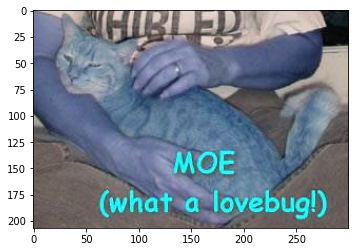

In [11]:
img = cv2.imread(train['filepath'][100])
print(type(img))
print(img.shape)
plt.imshow(img)

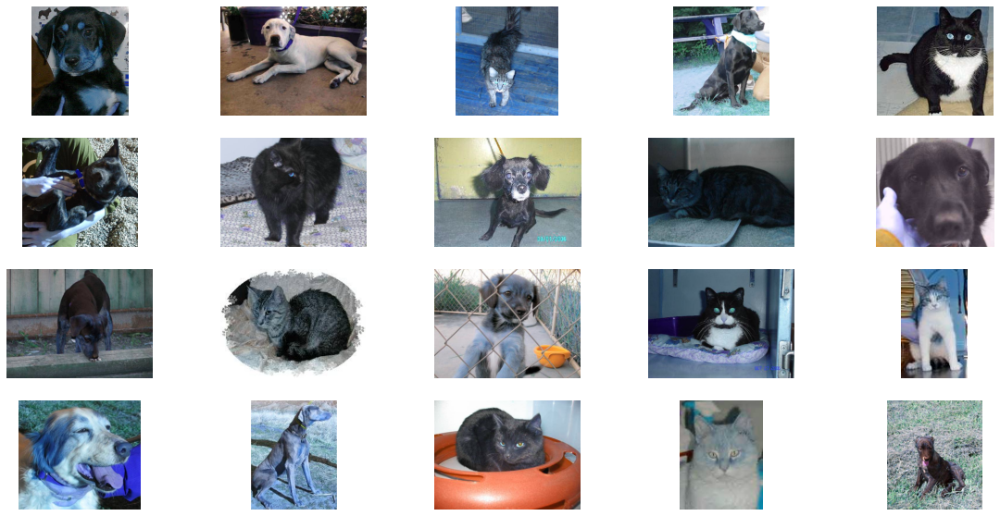

In [12]:
plt.figure(figsize=(20,10))
for i in range(20):
    vals = np.random.randint(0,len(train))
    plt.subplot(4,5,i+1)
    plt.imshow(cv2.imread(train['filepath'][vals]))
    plt.axis('off')
plt.show()

## **photos are not of same size**

In [13]:
train.shape

(25000, 2)

In [14]:
train.columns

Index(['filepath', 'truth_label'], dtype='object')

In [15]:
train['truth_label'].value_counts()

cat    12500
dog    12500
Name: truth_label, dtype: int64

## **split in validation data**

In [16]:
X_train, X_valid = train_test_split(train, test_size=0.2)

In [17]:
X_train.shape

(20000, 2)

In [18]:
X_train.columns

Index(['filepath', 'truth_label'], dtype='object')

In [19]:
X_valid.shape

(5000, 2)

## **Preprocessing**

In [20]:
train_datagen = ImageDataGenerator(
    rescale = 1.0/255,
                    shear_range = 0.2,
                    zoom_range = 0.2,
                    rotation_range=40,
                    width_shift_range=0.2,
                    height_shift_range=0.2,
                    horizontal_flip=True,
                    fill_mode='nearest')


In [21]:
test_datagen = ImageDataGenerator(rescale=1.0/255)

## **Applying the preprocessing**

In [22]:
train_gen = train_datagen.flow_from_dataframe(dataframe = X_train, x_col='filepath', y_col='truth_label', batch_size=16, 
                                               target_size = (224, 224),class_mode = 'categorical', shuffle=True)

Found 20000 validated image filenames belonging to 2 classes.


In [23]:
valid_gen = train_datagen.flow_from_dataframe(dataframe = X_valid, x_col='filepath', y_col='truth_label', batch_size=16, 
                                               target_size = (224, 224),class_mode = 'categorical', shuffle=True)

Found 5000 validated image filenames belonging to 2 classes.


## **Show preprocessed iamges**

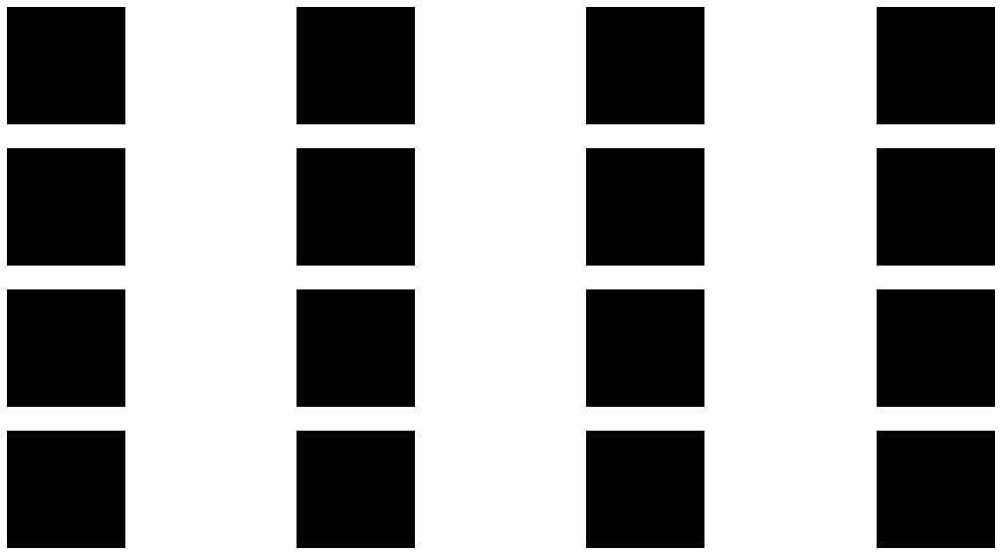

In [24]:
plt.figure(figsize=(20,10))
for i in range(16):
    vals = train_gen[0][0][i]
    vals = vals.astype('uint8')
    plt.subplot(4,4,i+1)
    plt.imshow(vals)
    plt.axis('off')
plt.show()

In [25]:
igcdcg7cgkjbyufgv7   # breaking point

NameError: ignored

## **Now images are also of same shapes**

# **Base Model: Model from scratch**

In [ ]:
classifier = Sequential()

classifier.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",
                padding="valid", input_shape = (224,224,3)))
classifier.add(MaxPooling2D(pool_size=2, strides=2, padding='valid'))
classifier.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",
                padding="valid"))
classifier.add(MaxPooling2D(pool_size=2, strides=2, padding='valid'))
classifier.add(Flatten())
classifier.add(Dense(128,activation="relu")) 
classifier.add(Dense(2,activation="sigmoid")) 

In [ ]:
classifier.summary()

In [ ]:
classifier.compile(optimizer="adam",loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history = classifier.fit(train_gen, validation_data = valid_gen, epochs=10)

## **loss: 0.5049 - accuracy: 0.7524 - val_loss: 0.5165 - val_accuracy: 0.7424**

In [ ]:
classifier.save('scratch_model_catvsdog.h5')

In [ ]:
uyguygfuibuyg ## breaking point

# **Prediction on test data**
## **I have weights, predict on that '/content/scratch_model_catvsdog.h5'**

In [ ]:
# !unzip test1.zip

In [34]:
from tensorflow import keras
classifier = keras.models.load_model('/content/scratch_model_catvsdog.h5')

In [35]:
test = pd.DataFrame({'filepath': list_full_paths('/content/test1')})

In [36]:
test_set = test_datagen.flow_from_dataframe(dataframe=test,
    x_col = 'filepath',
    y_col = None,
    class_mode = None,
    target_size = (224,224),
    batch_size = 16,
    shuffle = False)

Found 12500 validated image filenames.


In [37]:
test_preds = classifier.predict(test_set, steps = np.ceil(test.shape[0] / 16))

test["test_preds"] = np.argmax(test_preds, axis = 1)
labels = dict((v,k) for k,v in train_gen.class_indices.items())

test['test_preds'] = test['test_preds'].map(labels)

In [38]:
test.head()

,filepath,test_preds
0,/content/test1/8455.jpg,cat
1,/content/test1/11198.jpg,cat
2,/content/test1/3312.jpg,cat
3,/content/test1/3671.jpg,dog
4,/content/test1/6938.jpg,dog


## **Predictions**

In [39]:
test.head(10)

,filepath,test_preds
0,/content/test1/8455.jpg,cat
1,/content/test1/11198.jpg,cat
2,/content/test1/3312.jpg,cat
3,/content/test1/3671.jpg,dog
4,/content/test1/6938.jpg,dog
5,/content/test1/3737.jpg,cat
6,/content/test1/3537.jpg,dog
7,/content/test1/3712.jpg,cat
8,/content/test1/8801.jpg,cat
9,/content/test1/11806.jpg,dog


## **plot the random predictions**

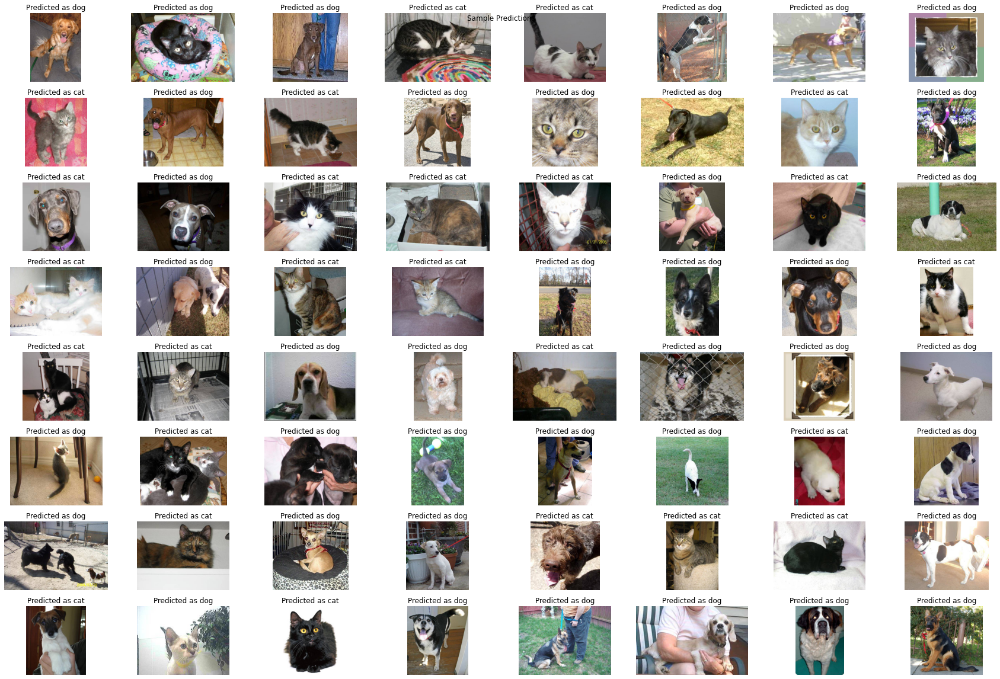

In [40]:
sample_test = test.sample(64).reset_index(drop = True)

fig = plt.figure(1, figsize = (24, 20))
fig.suptitle("Sample Predictions")

for i in range(len(sample_test)):
    
    plt.subplot(10, 8, i + 1)
    image = load_img(sample_test.filepath[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Predicted as {sample_test['test_preds'][i]}")
    
plt.tight_layout()
plt.show()

In [ ]:
jhhiguybkjb ##breaking point

## **Model1: Use dropout after conv & Fully connected layers without Batch normalization**
## [Article on Regularization](https://www.analyticsvidhya.com/blog/2021/03/introduction-to-batch-normalization/)
## [Cat vs Dog Kaggle](https://www.kaggle.com/meetnagadia/cats-vs-dogs-classification)
## [Drop and Batch Normalization Kaggle](https://www.kaggle.com/ryanholbrook/dropout-and-batch-normalization)
## [Covid Project Kaggle](https://dme2wmiz2suov.cloudfront.net/User(4778996)/Course(24649)/Section(131952)/Exercise(32411)/Assignment/1493915-Lungs_Chest_x_rays.pdf?Expires=1674445138&Signature=guLx0lpK9~aF~KP-82Lg~XxO8dqumMMztrNdkXLey-ZWfjNraJZLkzNVNDSwulDaXcKK05AgRTgSRSnZT~LmkQATI1Z43JpLaXQEoUqY6wJr2jnP7U7fPT4LRS-BWIXn8QOiNI-f8YhTPTmuvvRT1YdHVGOoLG05Ygk54rp81DNlz4zIejrBVL0dcatFimIFNOIXFRsMIBhooynmaHasn1NHEORs~E8EMoxPoX7kVqit18rHVqh1QIMPmIeIGgecL6eMQKIjIFy-YW9JEcPFILFxfX~z8BpJBkoi6y5TSfORofIo0yu1E1Z0Q1FGxAE~AB6l0M~DCIFhqI9Eh2BK8w__&Key-Pair-Id=APKAIIFZDCEANAVU2VTA)

In [ ]:
classifier = Sequential()

classifier.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",
                padding="valid", input_shape = (224,224,3)))
classifier.add(Dropout(0.1))
classifier.add(MaxPooling2D(pool_size=2, strides=2, padding='valid'))
classifier.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",
                padding="valid"))
classifier.add(Dropout(0.1))
classifier.add(MaxPooling2D(pool_size=2, strides=2, padding='valid'))
classifier.add(Flatten())
classifier.add(Dense(128,activation="relu")) 
classifier.add(Dropout(0.1))
classifier.add(Dense(2,activation="sigmoid")) 

In [ ]:
classifier.summary()

In [ ]:
classifier.compile(optimizer="adam",loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history = classifier.fit(train_gen, validation_data = valid_gen, epochs=10)

# **loss: 0.5451 - accuracy: 0.7286 - val_loss: 0.5409 - val_accuracy: 0.7314**

In [ ]:
classifier.save('model_1_catvsdog.h5')

In [ ]:
jhbjhfuyvu ## breaking point

# **Prediction on test data**
## **I have weights, Predict on that '/content/model_1_catvsdog.h5'**

In [42]:
from tensorflow import keras
classifier = keras.models.load_model('/content/model_1_catvsdog.h5')

In [43]:
test = pd.DataFrame({'filepath': list_full_paths('/content/test1')})

In [44]:
test_set = test_datagen.flow_from_dataframe(dataframe=test,
    x_col = 'filepath',
    y_col = None,
    class_mode = None,
    target_size = (224,224),
    batch_size = 16,
    shuffle = False)

Found 12500 validated image filenames.


In [45]:
test_preds = classifier.predict(test_set, steps = np.ceil(test.shape[0] / 16))

test["test_preds"] = np.argmax(test_preds, axis = 1)
labels = dict((v,k) for k,v in train_gen.class_indices.items())

test['test_preds'] = test['test_preds'].map(labels)

In [46]:
test.head()

,filepath,test_preds
0,/content/test1/8455.jpg,cat
1,/content/test1/11198.jpg,cat
2,/content/test1/3312.jpg,dog
3,/content/test1/3671.jpg,cat
4,/content/test1/6938.jpg,dog


In [47]:
test.head(10)

,filepath,test_preds
0,/content/test1/8455.jpg,cat
1,/content/test1/11198.jpg,cat
2,/content/test1/3312.jpg,dog
3,/content/test1/3671.jpg,cat
4,/content/test1/6938.jpg,dog
5,/content/test1/3737.jpg,cat
6,/content/test1/3537.jpg,dog
7,/content/test1/3712.jpg,cat
8,/content/test1/8801.jpg,cat
9,/content/test1/11806.jpg,dog


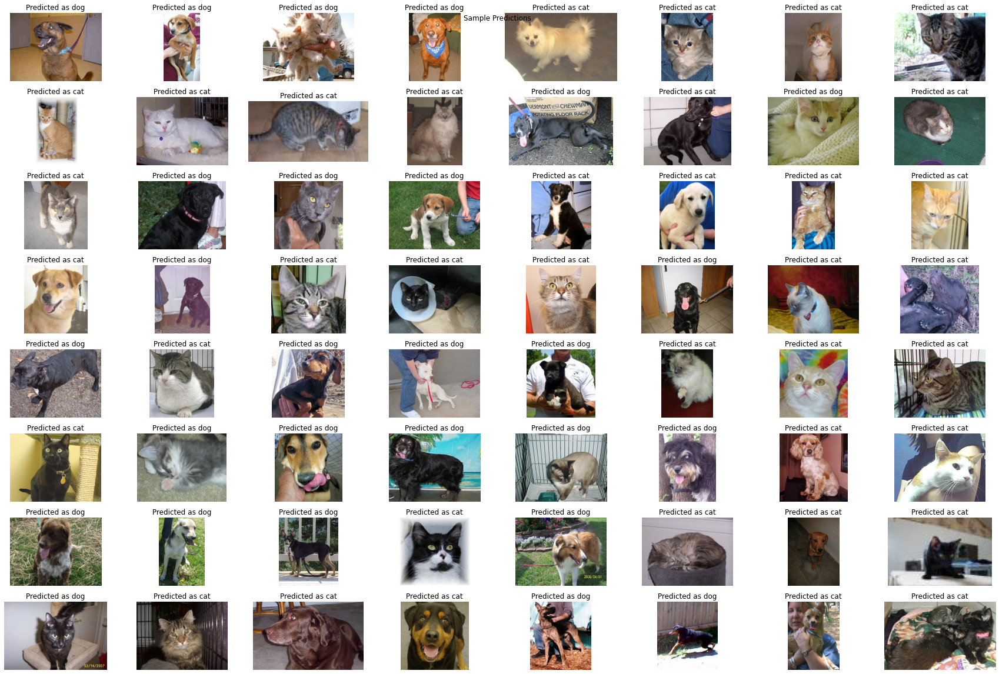

In [48]:
sample_test = test.sample(64).reset_index(drop = True)

fig = plt.figure(1, figsize = (24, 20))
fig.suptitle("Sample Predictions")

for i in range(len(sample_test)):
    
    plt.subplot(10, 8, i + 1)
    image = load_img(sample_test.filepath[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Predicted as {sample_test['test_preds'][i]}")
    
plt.tight_layout()
plt.show()

In [ ]:
yguygygyu ## breaking point

# **Model2: : Remove drop out, use Batch normalization**
## [Batch Normalization](https://analyticsindiamag.com/hands-on-guide-to-implement-batch-normalization-in-deep-learning-models/)
#### Batch normalization is one of the important features we add to our model helps as a Regularizer, normalizing the inputs, in the backpropagation process, and can be adapted to most of the models to converge better

![](https://149695847.v2.pressablecdn.com/wp-content/uploads/2020/07/batch_normalization.png)

In [51]:
classifier = Sequential()

classifier.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",
                padding="valid", input_shape = (224,224,3)))
classifier.add(BatchNormalization())
classifier.add(MaxPooling2D(pool_size=2, strides=2, padding='valid'))
classifier.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",
                padding="valid"))
classifier.add(BatchNormalization())
classifier.add(MaxPooling2D(pool_size=2, strides=2, padding='valid'))
classifier.add(Flatten())
classifier.add(Dense(128,activation="relu")) 
classifier.add(BatchNormalization())
classifier.add(Dense(2,activation="sigmoid")) 

In [52]:
classifier.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 222, 222, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 109, 109, 32)     128       
 hNormalization)                                                 
                                                      

In [53]:
classifier.compile(optimizer="adam",loss='categorical_crossentropy',metrics=['accuracy'])

In [56]:
history = classifier.fit(train_gen, validation_data = valid_gen, epochs=10)

Epoch 1/10
1250/1250 [==============================] - ETA: 0s - loss: 0.4782 - accuracy: 0.7719

KeyboardInterrupt: ignored

## **76.02 % accuracy**

In [55]:
classifier.save('model_2_catvsdog.h5')

In [ ]:
iuiuhig ## breaking point

# **Predictions on test data**
## **I have weights, predict on that /content/model_2_catvsdog.h5**

In [57]:
from tensorflow import keras
classifier = keras.models.load_model('/content/model_2_catvsdog.h5')

In [58]:
test = pd.DataFrame({'filepath': list_full_paths('/content/test1')})

In [59]:
test_set = test_datagen.flow_from_dataframe(dataframe=test,
    x_col = 'filepath',
    y_col = None,
    class_mode = None,
    target_size = (224,224),
    batch_size = 16,
    shuffle = False)

Found 12500 validated image filenames.


In [60]:
test_preds = classifier.predict(test_set, steps = np.ceil(test.shape[0] / 16))

test["test_preds"] = np.argmax(test_preds, axis = 1)
labels = dict((v,k) for k,v in train_gen.class_indices.items())

test['test_preds'] = test['test_preds'].map(labels)

In [61]:
test.head(10)

,filepath,test_preds
0,/content/test1/8455.jpg,cat
1,/content/test1/11198.jpg,cat
2,/content/test1/3312.jpg,cat
3,/content/test1/3671.jpg,cat
4,/content/test1/6938.jpg,dog
5,/content/test1/3737.jpg,cat
6,/content/test1/3537.jpg,dog
7,/content/test1/3712.jpg,cat
8,/content/test1/8801.jpg,cat
9,/content/test1/11806.jpg,dog


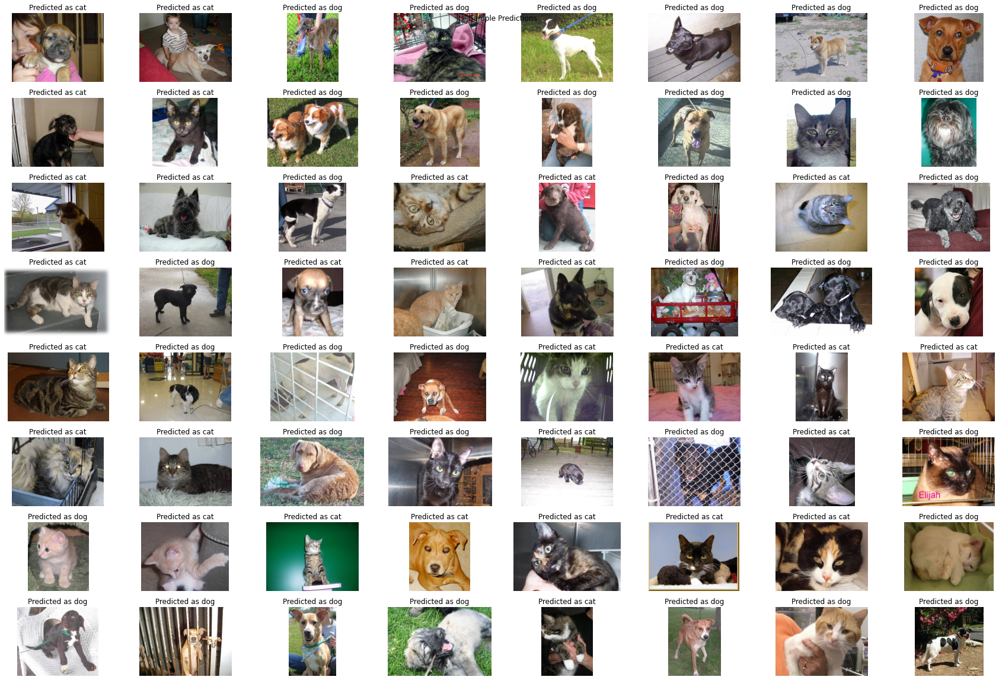

In [62]:
sample_test = test.sample(64).reset_index(drop = True)

fig = plt.figure(1, figsize = (24, 20))
fig.suptitle("Sample Predictions")

for i in range(len(sample_test)):
    
    plt.subplot(10, 8, i + 1)
    image = load_img(sample_test.filepath[i])
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Predicted as {sample_test['test_preds'][i]}")
    
plt.tight_layout()
plt.show()

## **Completed till model 2**
# **END** 